In [1]:
# @title Setup
from google.colab import auth
from google.cloud import bigquery
from google.colab import data_table

project = 'precise-crowbar-414008' # Project ID inserted based on the query results selected to explore
location = 'EU' # Location inserted based on the query results selected to explore
client = bigquery.Client(project=project, location=location)
data_table.enable_dataframe_formatter()
auth.authenticate_user()

## Reference SQL syntax from the original job
Use the ```jobs.query```
[method](https://cloud.google.com/bigquery/docs/reference/rest/v2/jobs/query) to
return the SQL syntax from the job. This can be copied from the output cell
below to edit the query now or in the future. Alternatively, you can use
[this link](https://console.cloud.google.com/bigquery?j=precise-crowbar-414008:EU:bquxjob_6a2752f7_18eebbcc029)
back to BigQuery to edit the query within the BigQuery user interface.

In [2]:
# Running this code will display the query used to generate your previous job

job = client.get_job('bquxjob_6a2752f7_18eebbcc029') # Job ID inserted based on the query results selected to explore
print(job.query)

SELECT * FROM `precise-crowbar-414008.neo_bank.user_marge_churn` 


# Result set loaded from BigQuery job as a DataFrame
Query results are referenced from the Job ID ran from BigQuery and the query
does not need to be re-run to explore results. The ```to_dataframe```
[method](https://googleapis.dev/python/bigquery/latest/generated/google.cloud.bigquery.job.QueryJob.html#google.cloud.bigquery.job.QueryJob.to_dataframe)
downloads the results to a Pandas DataFrame by using the BigQuery Storage API.

To edit query syntax, you can do so from the BigQuery SQL editor or in the
```Optional:``` sections below.

In [3]:
# Running this code will read results from your previous job

job = client.get_job('bquxjob_6a2752f7_18eebbcc029') # Job ID inserted based on the query results selected to explore
results = job.to_dataframe()
results

,churned,user_id,attributes_notifications_marketing_email,attributes_notifications_marketing_push,birth_year,city,country,created_date,num_contacts,num_referrals,num_successful_referrals,plan,user_settings_crypto_unlocked
0,0,user_5496,NaN,NaN,1988,Ilford,GB,2018-05-22 10:09:29.823256+00:00,0,0,0,STANDARD,0
1,0,user_324,NaN,NaN,1972,London,GB,2018-01-03 09:19:59.838061+00:00,18,0,0,STANDARD,0
2,0,user_13296,NaN,NaN,1992,Leixlip,IE,2018-09-11 23:26:58.293452+00:00,90,0,0,STANDARD,0
3,0,user_8168,NaN,NaN,1994,Wrocław,PL,2018-07-09 22:39:06.586224+00:00,30,0,0,STANDARD,0
4,0,user_4126,NaN,NaN,1981,Rayleigh,GB,2018-04-05 06:52:53.145968+00:00,0,0,0,STANDARD,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
18761,1,user_15866,1.0,1.0,1985,Kielce,PL,2018-11-27 11:49:03.685942+00:00,2,0,0,STANDARD,0
18762,1,user_10453,1.0,1.0,1978,Cisiec,PL,2018-08-07 16:24:29.002161+00:00,1,0,0,STANDARD,0
18763,1,user_17696,1.0,1.0,1983,Doroteia,RO,2018-12-06 05:19:56.840512+00:00,0,0,0,STANDARD,0
18764,1,user_10711,1.0,1.0,1987,Bucharest,RO,2018-08-24 11:40:20.867051+00:00,10,0,0,STANDARD,1


## Show descriptive statistics using describe()
Use the ```pandas DataFrame.describe()```
[method](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.describe.html)
to generate descriptive statistics. Descriptive statistics include those that
summarize the central tendency, dispersion and shape of a dataset’s
distribution, excluding ```NaN``` values. You may also use other Python methods
to interact with your data.

In [4]:
results.describe()

,churned,attributes_notifications_marketing_email,attributes_notifications_marketing_push,birth_year,num_contacts,num_referrals,num_successful_referrals,user_settings_crypto_unlocked
count,18766.0,12211.000000,12211.000000,18766.0,18766.0,18766.0,18766.0,18766.0
mean,0.347117,0.895504,0.945623,1983.63338,18.412395,0.0,0.0,0.185388
std,0.476066,0.305915,0.226770,11.355439,47.19725,0.0,0.0,0.388623
min,0.0,0.000000,0.000000,1929.0,0.0,0.0,0.0,0.0
25%,0.0,1.000000,1.000000,1978.0,0.0,0.0,0.0,0.0
50%,0.0,1.000000,1.000000,1986.0,5.0,0.0,0.0,0.0
75%,1.0,1.000000,1.000000,1992.0,20.0,0.0,0.0,0.0
max,1.0,1.000000,1.000000,2001.0,2918.0,0.0,0.0,1.0


# editing by me (marge user and churn )


In [5]:
results.isnull().sum()

churned                                        0
user_id                                        0
attributes_notifications_marketing_email    6555
attributes_notifications_marketing_push     6555
birth_year                                     0
city                                           0
country                                        0
created_date                                   0
num_contacts                                   0
num_referrals                                  0
num_successful_referrals                       0
plan                                           0
user_settings_crypto_unlocked                  0
dtype: int64

In [6]:
import pandas as pd
df_cleaned = results.dropna(subset=['attributes_notifications_marketing_push'])
df_cleaned

,churned,user_id,attributes_notifications_marketing_email,attributes_notifications_marketing_push,birth_year,city,country,created_date,num_contacts,num_referrals,num_successful_referrals,plan,user_settings_crypto_unlocked
6555,0,user_4399,0.0,1.0,1993,Vienna,ES,2018-04-13 11:37:26.963130+00:00,23,0,0,STANDARD,0
6556,0,user_7792,0.0,0.0,1983,Dublin,IE,2018-06-19 07:18:11.565668+00:00,61,0,0,PREMIUM,0
6557,0,user_4576,0.0,1.0,1990,Espoo,FI,2018-04-20 04:28:58.170890+00:00,11,0,0,STANDARD,0
6558,0,user_7204,0.0,0.0,1982,Leiria,PT,2018-06-14 12:26:01.080794+00:00,57,0,0,METAL,1
6559,0,user_3027,0.0,1.0,1982,Bucharest,RO,2018-03-30 12:19:00.128206+00:00,56,0,0,PREMIUM,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
18761,1,user_15866,1.0,1.0,1985,Kielce,PL,2018-11-27 11:49:03.685942+00:00,2,0,0,STANDARD,0
18762,1,user_10453,1.0,1.0,1978,Cisiec,PL,2018-08-07 16:24:29.002161+00:00,1,0,0,STANDARD,0
18763,1,user_17696,1.0,1.0,1983,Doroteia,RO,2018-12-06 05:19:56.840512+00:00,0,0,0,STANDARD,0
18764,1,user_10711,1.0,1.0,1987,Bucharest,RO,2018-08-24 11:40:20.867051+00:00,10,0,0,STANDARD,1


In [12]:
df_cleaned.isnull().sum()

churned                                     0
user_id                                     0
attributes_notifications_marketing_email    0
attributes_notifications_marketing_push     0
birth_year                                  0
city                                        0
country                                     0
created_date                                0
num_contacts                                0
num_referrals                               0
num_successful_referrals                    0
plan                                        0
user_settings_crypto_unlocked               0
dtype: int64

In [13]:
# Count the occurrences of each value in the 'churn' column
churn_counts = df_cleaned['churned'].value_counts()

# Create a DataFrame from the value counts
churn_counts_df = pd.DataFrame({'churn': churn_counts.index, 'count': churn_counts.values})

# Create a pie chart using Plotly Express
fig = px.pie(churn_counts_df, values='count', names='churn', title='Churn Distribution')

# Show the pie chart
fig.show()

In [8]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

# Drop unnecessary columns (if any)
df_cleaned2 = df_cleaned.drop(columns=["user_id", "created_date"])  # Drop user_id and created_date columns

# Split the data into features (X) and the target variable (y)
X = df_cleaned2.drop(columns=['churned'])
y = df_cleaned2['churned']

# Define the categorical columns
categorical_cols = ['city', 'country', 'plan']

# Apply one-hot encoding to categorical columns
preprocessor = ColumnTransformer(transformers=[('cat', OneHotEncoder(), categorical_cols)],
                                 remainder='passthrough')
X_encoded = preprocessor.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Initialize the logistic regression model
model = LogisticRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the testing data
y_pred = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.7093737208350389


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [10]:
import plotly.express as px

# Count the occurrences of each predicted churn value
churn_counts = pd.Series(y_pred).value_counts()

# Create a DataFrame from the value counts
churn_counts_df1 = pd.DataFrame({'churned': churn_counts.index, 'count': churn_counts.values})

# Create a pie chart using Plotly Express
fig = px.pie(churn_counts_df1, values='count', names='churned', title='Predicted Churn Distribution')

# Show the pie chart
fig.show()

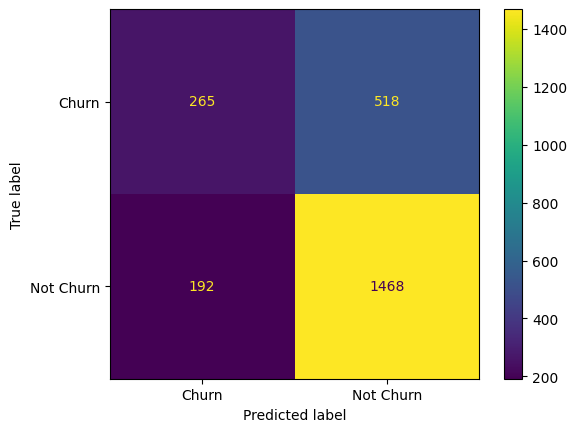

In [14]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Create a confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred, labels=[1, 0])  # Specify the labels as [1, 0]

# Display the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=['Churn', 'Not Churn'])
disp.plot()